## Support Vector Machine (SVM)

A Support Vector Machine (SVM) is a supervised learning algorithm used for classification and regression tasks. SVM aims to find the optimal hyperplane that best separates the classes in a high-dimensional space. They are widely used in various fields, including pattern recognition, image analysis, and natural language processing.

## Key Terms of SVM

### 1. Hyperplane

A hyperplane is a decision boundary that separates data points into different classes in a high-dimensional space. In two-dimensional space, a hyperplane is simply a line that separates the data points into two classes. In three-dimensional space, it is a plane that separates the data points into two classes. Similarly, in N-dimensional space, a hyperplane has (N-1)-dimensions.

It can be used to make predictions on new data points by evaluating which side of the hyperplane they fall on. Data points on one side of the hyperplane are classified as belonging to one class, while data points on the other side of the hyperplane are classified as belonging to another class.

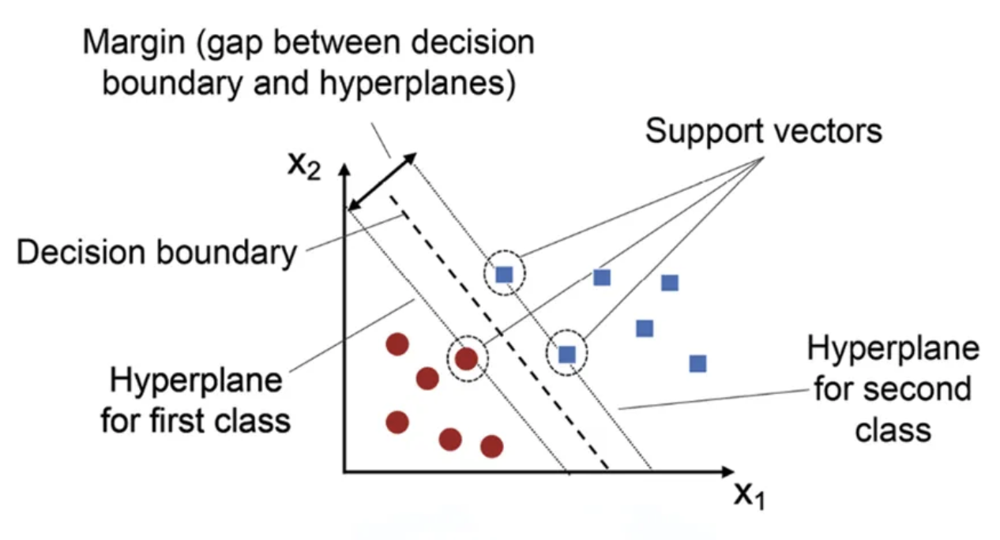

### 2. Support Vectors: 

They are the data points that lie closest to the decision boundary (hyperplane) in a Support Vector Machine (SVM). These data points are important because they determine the position and orientation of the hyperplane, and thus have a significant impact on the classification accuracy of the SVM. In fact, SVMs are named after these support vectors because they “support” or define the decision boundary. The support vectors are used to calculate the margin, which is the distance between the hyperplane and the closest data points from each class. The goal of SVMs is to maximize this margin while minimizing classification errors.

### 3. Margin

A margin is the distance between the decision boundary (hyperplane) and the closest data points from each class. The goal of SVMs is to maximize this margin while minimizing classification errors. A larger margin indicates a greater degree of confidence in the classification, as it means that there is a larger gap between the decision boundary and the closest data points from each class. The margin is a measure of how well-separated the classes are in feature space. SVMs are designed to find the hyperplane that maximizes this margin, which is why they are sometimes referred to as maximum-margin classifiers.

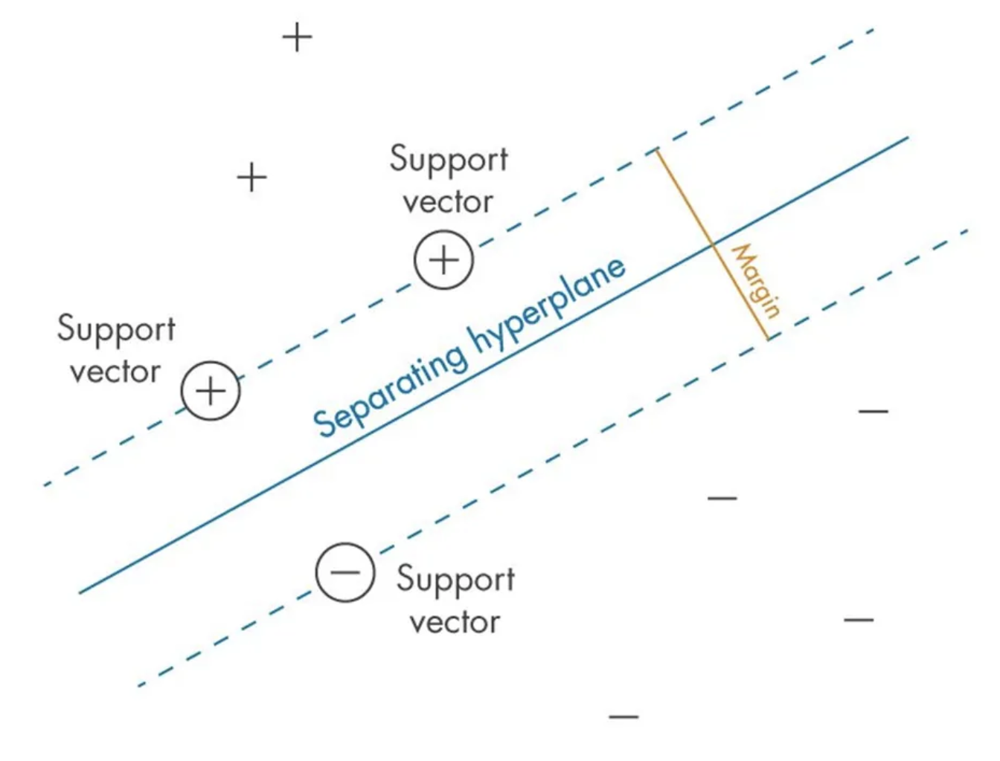

### 4. Kernel Function:

A function that transforms the input data into a higher-dimensional space to make it possible to find a linear separation. Common kernels include linear, polynomial, radial basis function (RBF), and sigmoid.

## What Happens if the Data is Not Linearly Classifiable? 

If the data is not linearly separable in its original feature space, SVM uses the kernel trick to map the data into a higher-dimensional space where a linear separator can be found. This transformation allows SVM to handle complex, non-linear relationships.

#### Let’s look at an example:

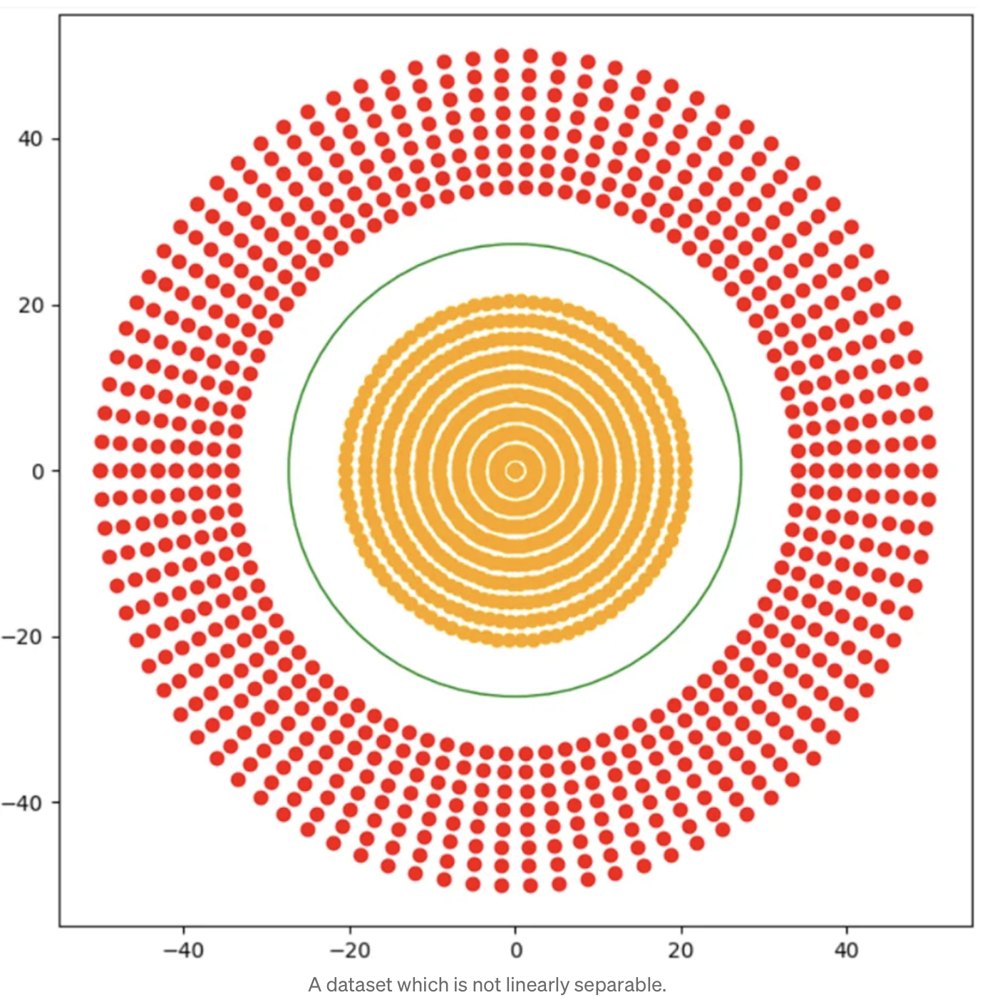

In the above figure, a 2-D hyperplane was not possible and hence transformation was required.

### What is transformation or addition of a new feature?

We have two features X and Y, and the data which not linearly classifiable. What we need to do is add another dimension in which if the data is plotted it becomes linearly separable.

Values of a point in the dimensions are nothing but column values of the point. To add another dimension we have to create another column (or feature).

Here we have two features X and Y, a third feature is needed which will be a function of the original features i.e. X and Y, which will be enough to classify the data linearly in three dimensions.

We take the third feature Z = f(x,y); f representing a function on X and Y. Here the Radial Basis Function(RBF) (measuring Euclidean distance) from the origin is enough.
Z = (X²+ Y²)^(1/2)

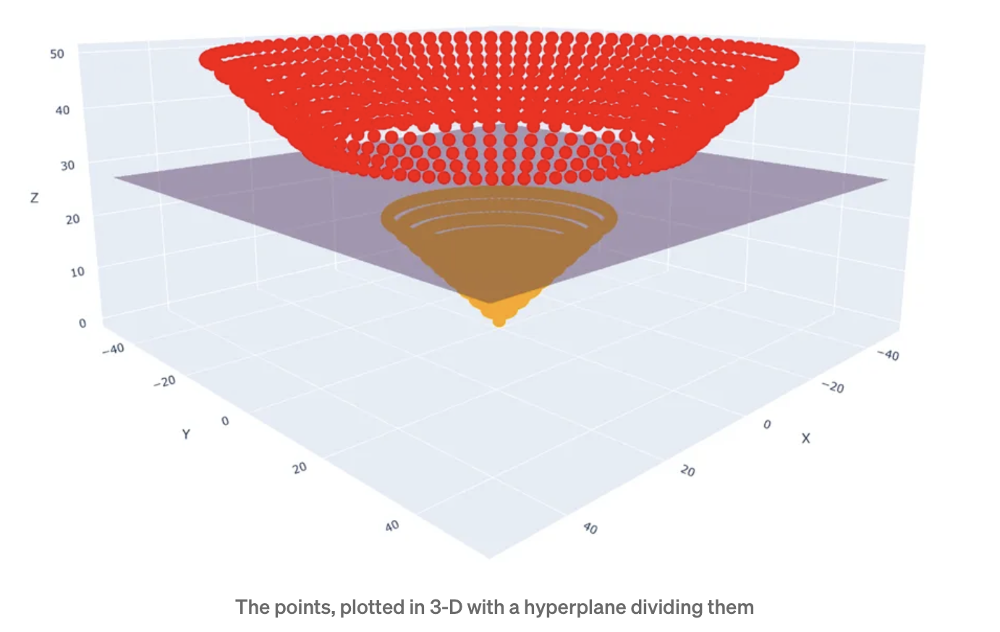

Here the hyperplane was as simple as creating a plane parallel to the X-Y plane at a certain height.

The main problem here is the heavy load of the calculations to be performed.

Here we took points centred on origin in a concentric manner. Suppose the points were not concentric but could be separated by the RBF. So we would need to take each point in the dataset as a reference each time and find the distance of all other points with respect to that point.

So we would need to calculate n*(n-1)/2 distances. (n-1 other points with respect to each n points, but once the distance of 1–2 is calculated the distance of 2–1 does need to be calculated)

### Time Complexity

The time complexity of a square root is O(log(n)) and for power, addition is O(1). Thus to do n*(n-1)/2 total calculations we would need O(n²log(n)) time complexity.

But as our goal is to separate the classes and not find the distance, we can do away with the square root. (Z = X²+ Y²)

In that case, we would get a time complexity of O(n²).

### But this was not even the problem, the problem starts now

Here we knew which function was to be used. But there could be many functions with just the degree limited to 2 (X, Y, XY, X² and Y²).

We can use these 5 as 3 dimensions in ⁵C₃ ways = 10 ways. Not to mention, the infinite possibility of their linear combinations (Z = 4X² + 7XY + 13Y², Z= 8XY +17X², and so on…).

And this was only for 2-degree polynomials. If we started using 3-degree polynomials then X³, Y³, X²Y, XY² will also come in the picture.

Not all of these are good enough to be our additional feature.

For example, I started with (X vs Y vs XY as the features):

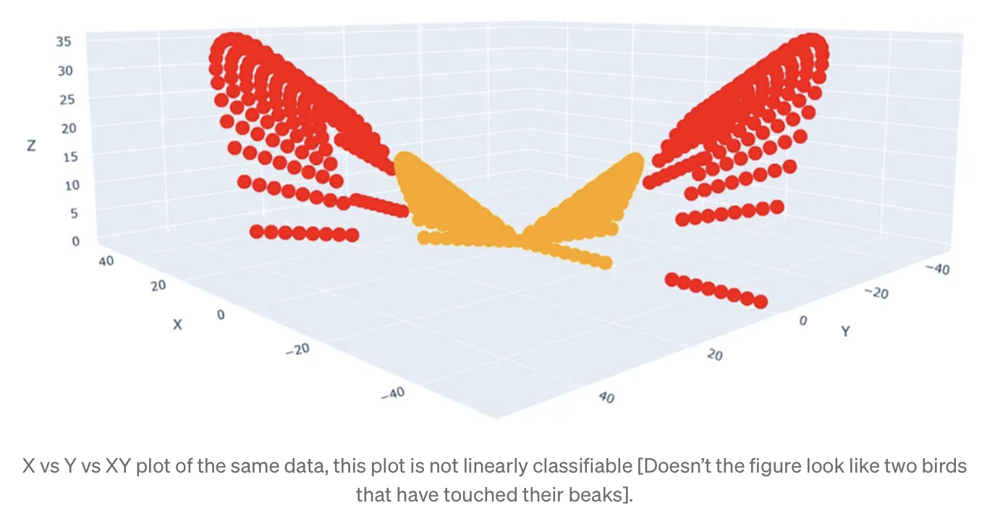

All the calculations and computations that went into this plot were in vain.

Now we have to use another function as the feature and try again.

Say, I use (X²+vs Y² vs XY as the features, yes I replaced X and Y):

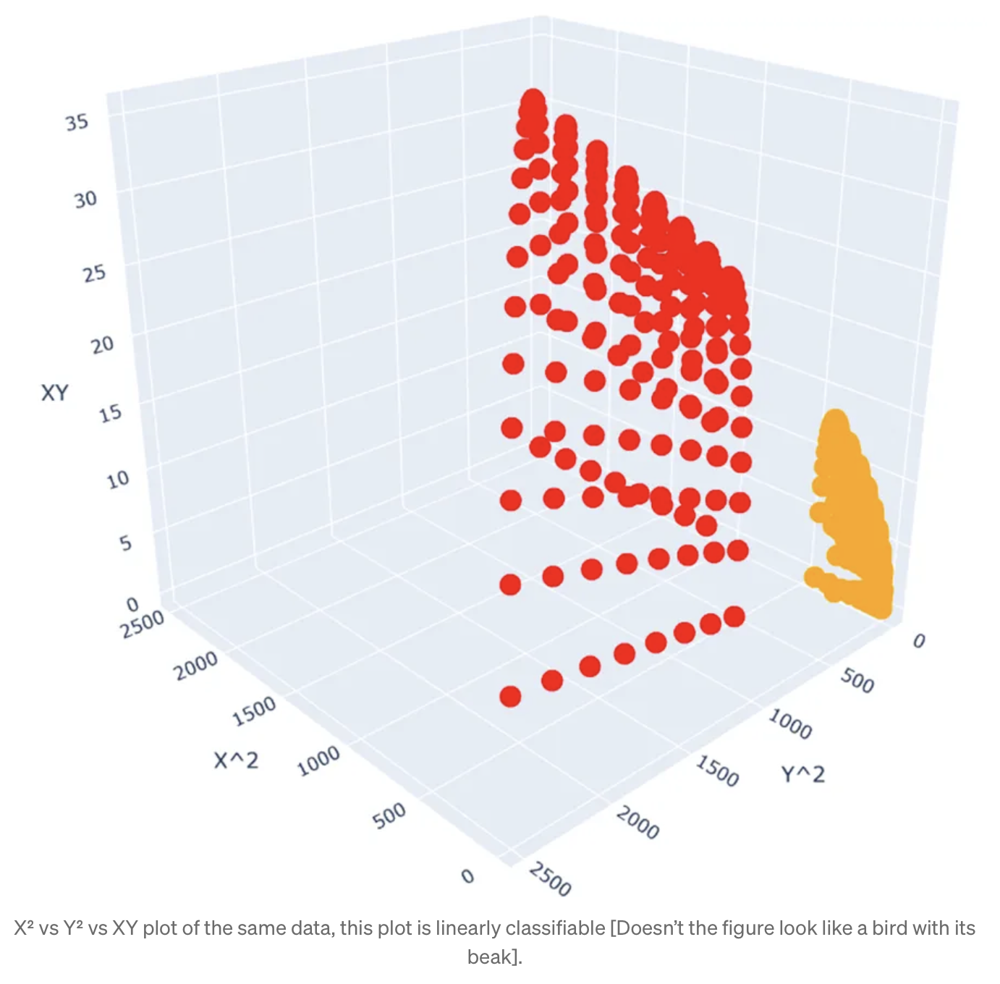

I saw that earlier data and noticed that it wasn't linearly separable since yellow was in between the red points.
Since the two yellow beaks met at the centre and one of them was going in the negative X and negative Y direction, I decided to square X and Y so that a new set of values begin from 0 forming only a single separation region between the beak and the bird’s face as compared to two earlier.

This plot is linearly separable, in this way, we can reuse the XY calculations and plot smartly to get the desired features to separate the data.

But even this has limitations, such as using only one or two feature datasets so we get a plot in 3-d and not more dimensions, also our brain's capacity to look for patterns to identify the next set of features and what if the first plot had no pattern so we had to again take a guess for a feature and start from scratch.

If we got the desired feature set in only two steps as we got above, even then this method is slower than the one we actually use.

What we use is called the Kernel Trick.

## The Kernel Trick

A Kernel Trick instead of adding another dimension/feature, finds the similarity of the points.

Instead of finding f(x,y) directly, it computes the similarity of the image of these points. In other words, instead of finding f(x1,y1) and f(x2,y2) we take the points (x1,y1) and (x2,y2) and compute how similar would their outputs be using a function f(x,y); where f can be any function on x,y.

Thus we don’t need to find a suitable set of features here. We find similarity in such a way that it is valid for all sets of features.

To calculate the similarity we use the Gaussian function.

f(x) = ae^(-(x-b)²/2c²)

a : represents the height of the peak of the curve

b : represents the position of the centre of the peak

c : is the standard deviation of the data

For RBF Kernel we use:

K(X,X’) = e^-γ(|X-X’|²) = (1/ e^|X-X’|²) γ

γ : is a hyperparameter which represents the linearlity of the model (γ ∝ 1/c²)

X,X’ :represents the position vectors of the two points

A small γ (tending to 0) means a more linear model and a large γ means a more non-linear model.

Here we have 2 models (left with γ = 1 and right with γ = 0.01, much more linear in nature).

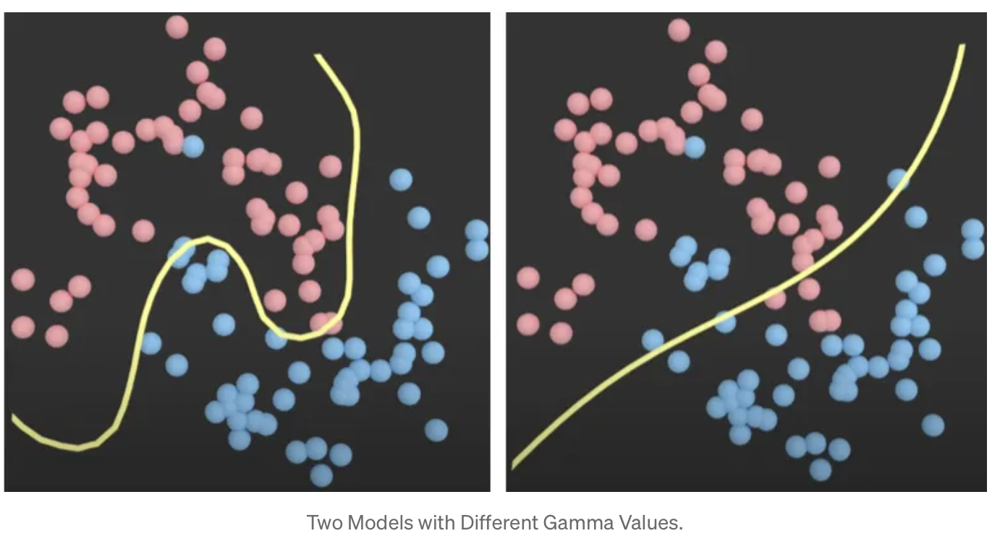

## So why not let gamma be a very high value? What is the use of a low γ?

Large values of gamma may lead to overfitting as well and thus we need to find appropriate gamma values.

Figure with 3 models, from left γ = 0.1, γ = 10, γ = 100. (The left one is accurately fitted, the middle is overfitted and the right one is extremely overfitted)

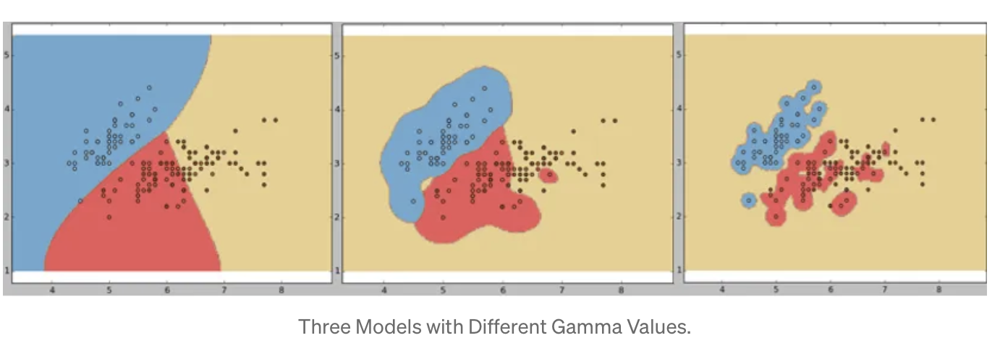

### Time Complexity 

Since we need to find the similarity of each point with respect to all other points we need a total of n*(n-1)/2 calculations.

Exponent has a time complexity of O(1) and thus we get a total time complexity of O(n²).

We do not need to plot points, check feature sets, take combinations, etc. This makes this method way more efficient.

What we do have here is the usage of different Kernels for this.

1. Linear Kernel: K(xi​,xj​)=xi​⋅xj​	
 
2. Polynomial Kernel: K(xi​,xj​)=(γxi​⋅xj​+r)d
 
3. Radial Basis Function (RBF) Kernel: K(xi​,xj​)=exp(−γ∥xi​−xj​∥2)

4. Sigmoid Kernel: K(xi​,xj​)=tanh(γxi​⋅xj​+r)

## Hard Margin Classification and Soft Margin Classification 

### Hard Margin Classification

Used when the data is linearly separable with no misclassification.
The goal is to find the hyperplane that perfectly separates the classes with the maximum margin.
Not practical for real-world data that may have noise and overlap.

If we strictly impose that all points must be off the street on the correct side then this is called Hard Margin Classification.

There are two issues with this method. First, it would only work with linearly separable data and not for non-linearly separable data (which may be linearly classifiable for the most part).

Second, is its sensitivity to outliers. In the figure below the Red Point is introduced as an outlier in the left class and it significantly changes the decision boundary, this may result in misclassifications of non-outlier data of the second class while testing the model.

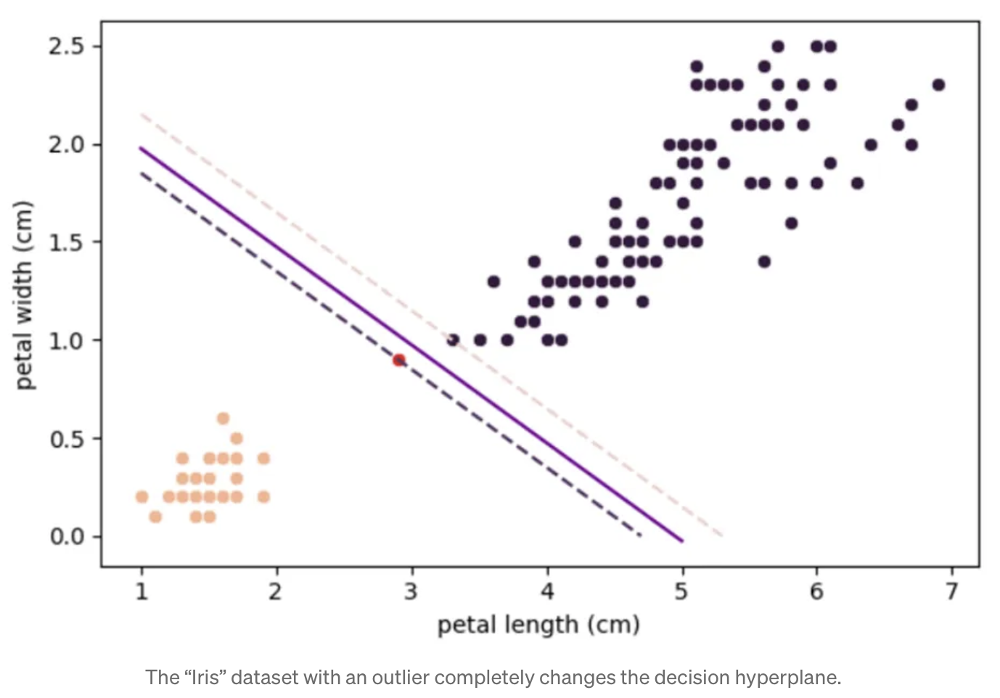

Although this model has not misclassified any of the points it is not a very good model and will give higher errors during testing.

To avoid this, we use Soft Margin Classification.

### Soft Margin Classification 

Allows some misclassifications to handle noisy and overlapping data.
Introduces a slack variable ξ to permit some margin violations.
The objective is to balance maximizing the margin and minimizing the classification error, controlled by a regularization parameter C.

A soft margin is a type of margin that allows for some misclassification errors in the training data.

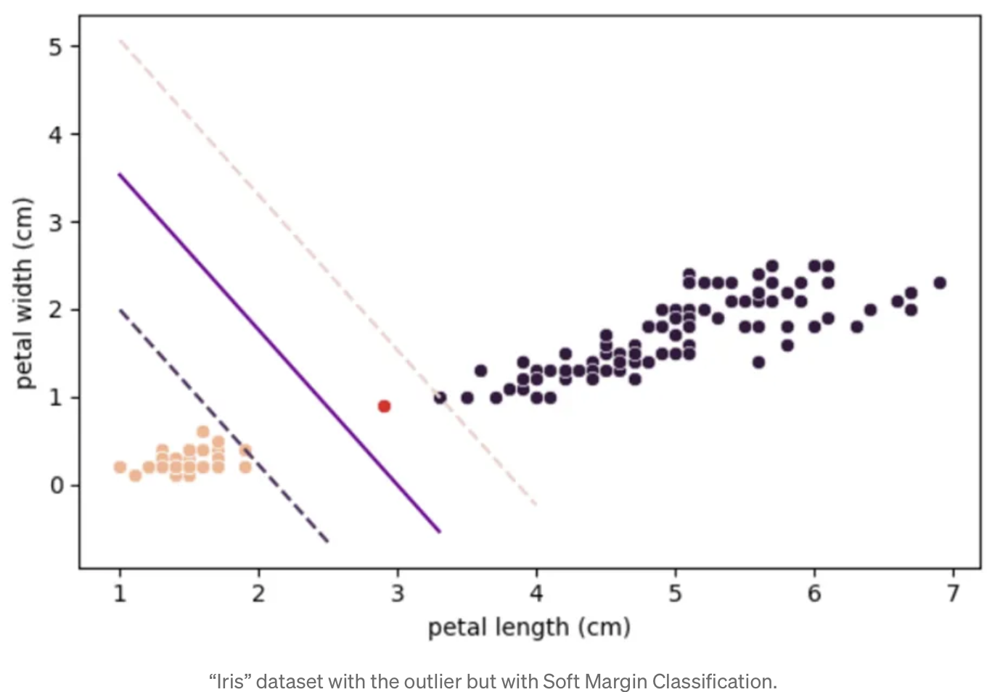

Here, a soft margin allows for some misclassification errors by allowing some data points to be on the wrong side of the decision boundary.

Even though there is a misclassification in the training data set and worse performance with respect to the previous model, the general performance would be much better during testing, as a result of how far it is from both classes.

But we can solve the problem of outliers by removing them using data preprocessing and data cleaning right? Then why Soft Margins?

They are used mainly when the data is not linearly separable, meaning that it is not possible to find a hyperplane that perfectly separates the classes without any errors and to avoid outliers (Hard Margin Classification is not possible). Example :

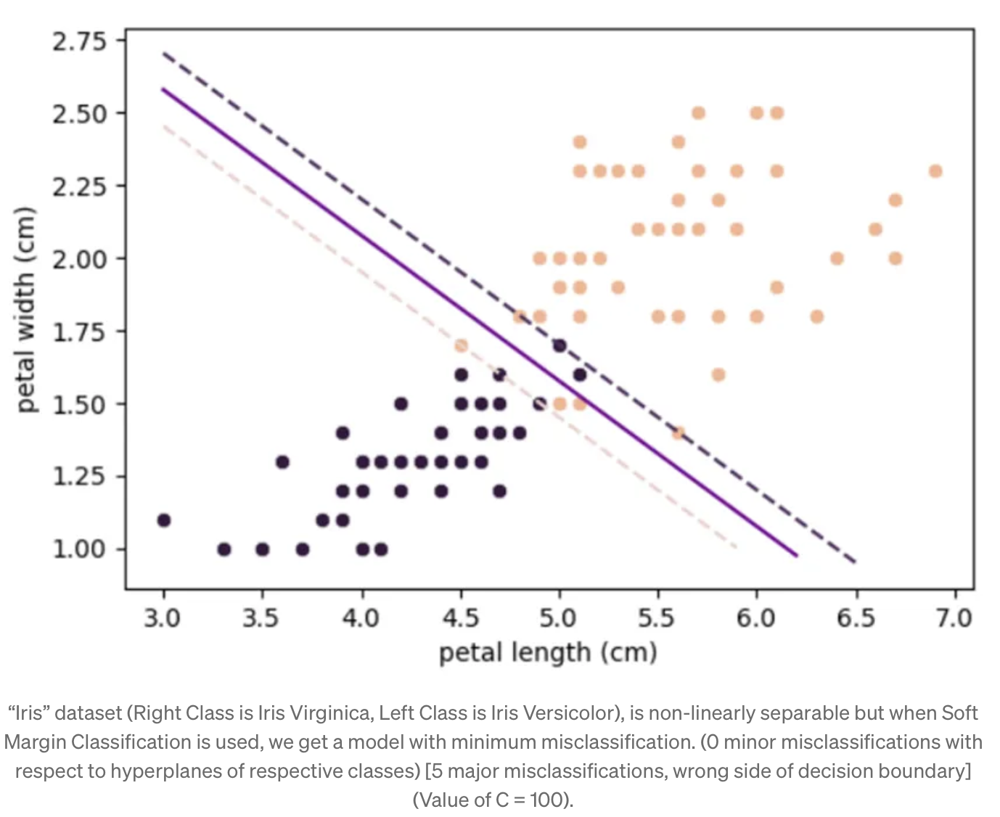

## How are Soft Margins working?

This is a phenomenon similar to overfitting and underfitting which happens with very high values of C and very low values of C.

Very low values will give very poor results as seen (similar to the case of underfitting).

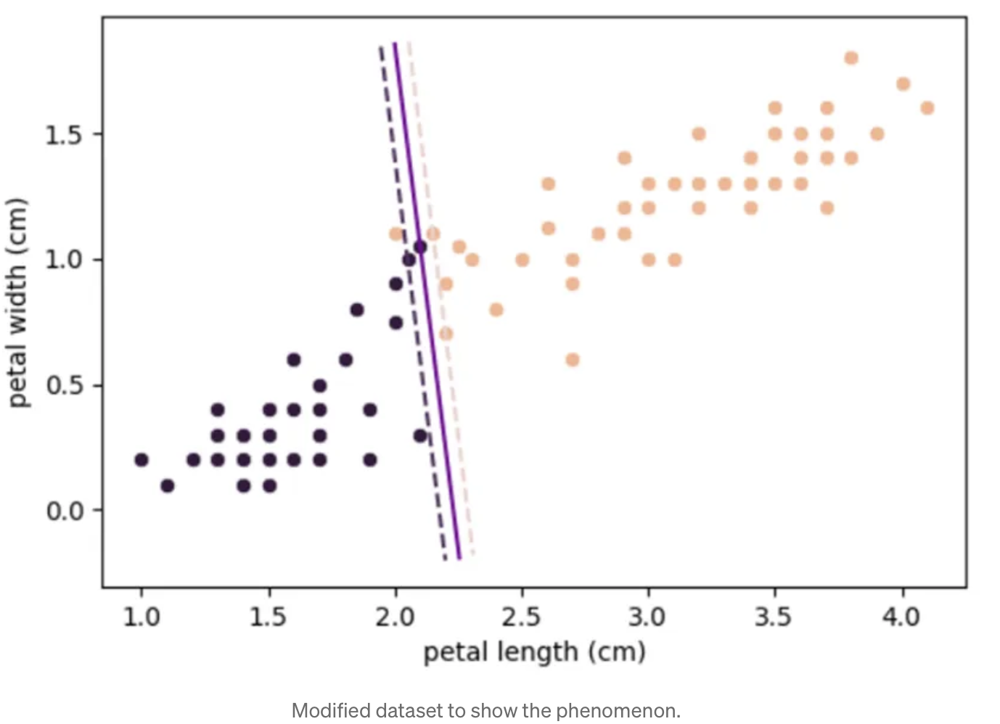

Model with C = 1000, is unsuitable as it is too close to the left class at the bottom and too close to the right class at the top, with chances of misclassifying data (here there is only 1 major misclassification and 1 minor misclassification hence, during training the model is good, but the model is not good for general decision making and may perform poorly during testing).

Thus models with a very high value of C may also give poor results on testing (similar to the case of overfitting).

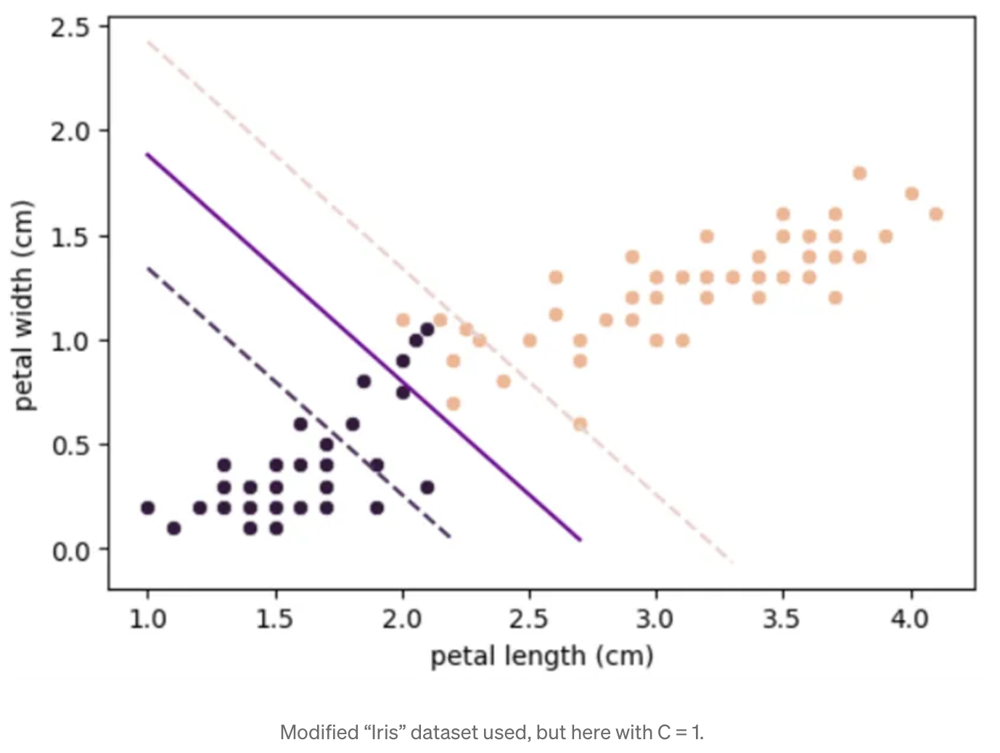

Model with C = 1, suitable and better-generalised model. (Though there are 3 major misclassifications and about 12 minor misclassifications and thus a worse performance on training data but the model keeps in mind the bulk of the data and creates decision boundaries according to that, hence it has better performance during testing owing to its distance from both the classes).

Note: Minor misclassification is a term which I use to describe data not correctly classified by the class’ hyperplane. They do not lead to worse performance directly but give an indicator that the model may be worse. Hence in the above case despite 15 misclassifications performance is not 7.5 times worse, but only 3 times worse on training data due to 3 times more major misclassifications.

Remember I said initially about how in theory the decision boundary shall be in between the support vectors, but it was slightly closer to the darker class. That, was due to regularization. It created a model with 2 minor misclassifications such that the overall model is a more accurate one.
And thus the model should have been represented like this:

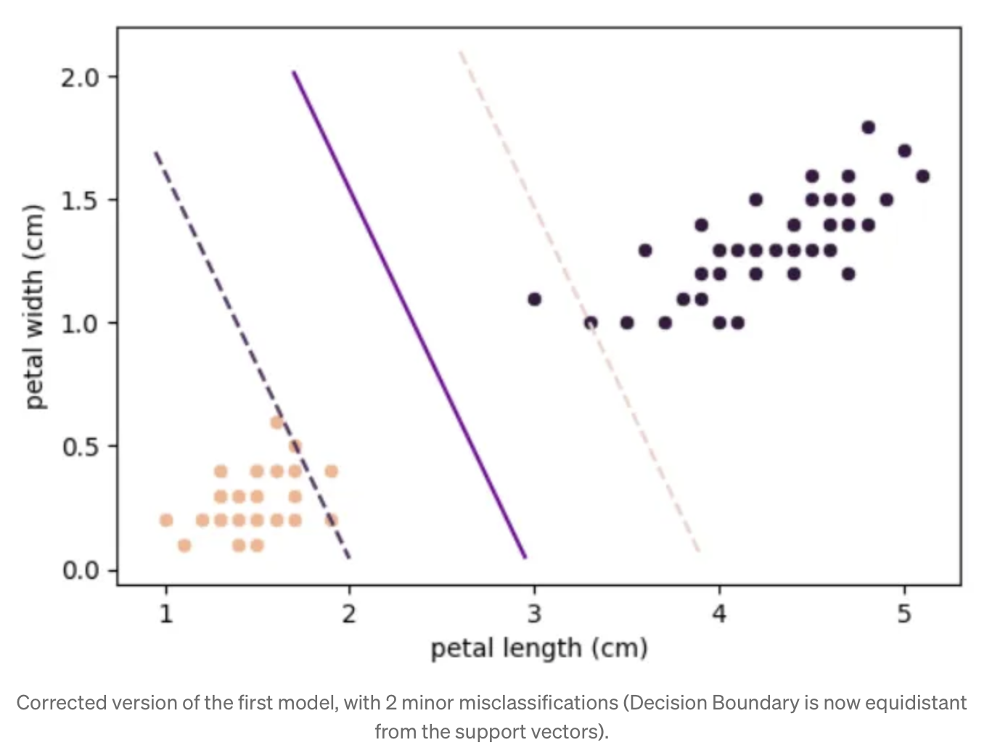

## Regression using SVM

SVMs, although generally used for classification can be used for both regression and classification. Support Vector Regression (SVR) is a machine learning algorithm used for regression analysis. It is different from traditional linear regression methods as it finds a hyperplane that best fits the data points in a continuous space, instead of fitting a line to the data points.

SVR in contrast to SVM tries to maximise the number of points in the street (margin), the width is controlled by a hyperparameter ε (epsilon).

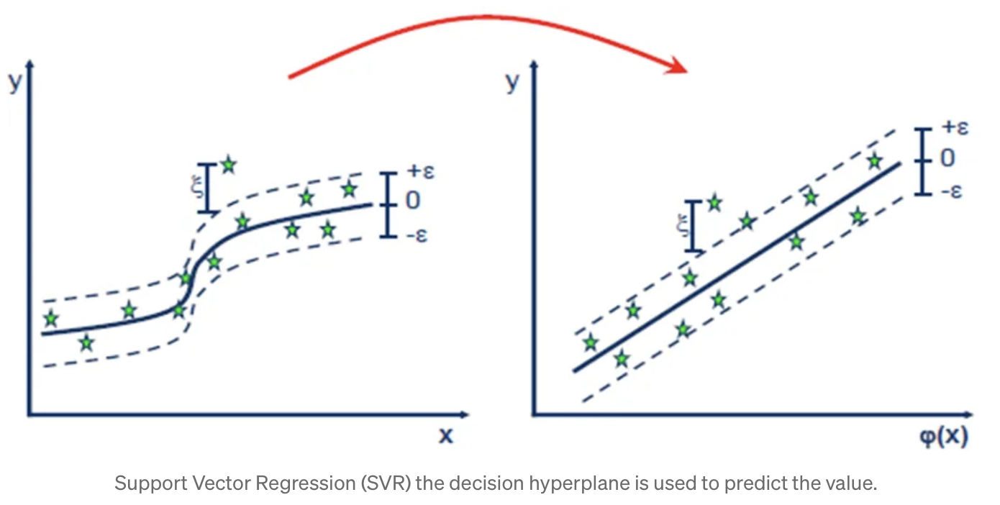

An analogy of this could be passing a flyover or a bridge over buildings or houses where we want to give shade to the most number of houses keeping the bridge thinnest.

SVR wants to include the whole data into its reach while trying to minimise the margin, basically trying to encompass the points. Whereas linear regression wants to pass a line such that the sum of distances of the points from the line is minimum.

## The advantages of SVR over normal regression are:

1. Non-linearity: SVR can capture non-linear relationships between input features and the target variable. It achieves this by using the kernel trick. In contrast, Linear Regression assumes a linear relationship between the input features and the target variable and Non-Linear Regression would require a lot of computation.

2. Robustness to outliers: SVR is more robust to outliers compared to Linear Regression. SVR aims to minimize the errors within a certain margin around the predicted values, known as the epsilon-insensitive zone. This characteristic makes SVR less influenced by outliers that fall outside the margin, leading to more stable predictions.

3. Sparsity of support vectors: SVR typically relies on a subset of training instances called support vectors to construct the regression model. These support vectors have the most significant impact on the model and represent the critical data points for determining the decision boundary. This sparsity property allows SVR to be more memory-efficient and computationally faster than Linear Regression, especially for large datasets. Also, an advantage is that after the addition of new training points the model does not change if they lie in the margin.

4. Control over model complexity: SVR provides control over model complexity through hyperparameters such as the regularization parameter C and the kernel parameters. By adjusting these parameters, you can control the trade-off between model complexity and generalization ability this level of flexibility is not offered by linear regression.

## Applications and Uses of SVM

Support Vector Machines (SVMs) have been successfully applied to various real-world problems across different domains. Here are some notable applications of SVMs:

Image Classification: SVMs have been widely used for image object recognition, handwritten digit recognition and optical character recognition (OCR). They have been employed in systems like filtering image-based spam and face detection systems used for security, surveillance, and biometric identification.

Text Classification: SVMs are effective for text categorization tasks, such as sentiment analysis, spam detection, and topic classification.

Bioinformatics: SVMs have been applied in bioinformatics for tasks such as protein structure prediction, gene expression analysis, and DNA classification.

Financial Forecasting: SVMs have been used in financial applications for tasks such as stock market prediction, credit scoring, and fraud detection.

Medical Diagnosis: SVMs have been utilized in medical diagnosis and decision-making systems. They can assist in diagnosing diseases, predicting patient outcomes, or identifying abnormal patterns in medical images.